# Solving the Brachistochrone Problem with a Gradient Descent Algorithm
### James Saslow
### 2/1/2023

In [1]:
import numpy as np
import pylab as plt

# Animation
from IPython.display import HTML
from math import floor
from matplotlib.animation import FuncAnimation

In [2]:
np.random.seed(2)

In [3]:
# Calculates the elapsed time on a single ramp
def t(yi,yf):
    cons = np.sqrt(2/g)
    top  = np.sqrt((yf - yi)**2 + dx**2)
    bot  = np.sqrt(np.abs(yf)) + np.sqrt(np.abs(yi))
    return cons*top/bot

# Calculates elapsed time on all ramps
def T(Y):
    tt = 0 # total time
    for i in range(len(Y)-1):
        yi = Y[i]
        yf = Y[i+1]
        tt += t(yi,yf)
    return tt


# Calculates the gradient of T
def grad_T(Y):
    T_regular  = T(Y) # time with no shift
    grad_vec = []
    for i in range(1,N):
        Y[i] += dy # perturbing each element individually by dy
        grad_vec.append( (T(Y) - T_regular)/dy )
        Y[i] -= dy
    
    gradient = np.zeros((len(Y)))
    gradient[1:-1] = grad_vec
    
    return gradient


def make_brach(R):
    theta = np.linspace(0,np.pi,200)
    x_val = R*(theta - np.sin(theta))
    y_val = R*(1 + np.cos(theta) - 2)
    plt.plot(x_val,y_val, color = 'orange',lw='7', alpha = 0.6, label = 'Cycloid')
    
    
def time_brach(R,g):
    return np.pi*np.sqrt(R/g)

In [4]:
g = 1 # gravitational constant
N = 14 # Number of inclined planes
x = np.linspace(0,np.pi,N+1)
dx = np.pi / N
dy = 0.000001
lr = 0.05 # learning rate
eps = 0.00001 #Error cutoff


Y = np.zeros((N+1)) #Joints + 2 endpoints
Y[-1] = -2


J = - 2*np.random.random(N-1) # Just random apriori joints

Y[1:-1] = J # Assigning random joints to Y

# Y_record = [Y] # Keeping a record of optimization learning
T_record = [T(Y)]


In [5]:
# #Using a while loop to test robstness of the algorithm

# k = 1
# while 1==1:
#     Y+= -lr*grad_T(Y)
#     time  = T(Y)
#     T_record.append(time)
# #     print(abs(T_record[k] - T_record[k-1])/eps) # Printing how close the condition is from epsilon
#     if abs(T_record[k] - T_record[k-1]) <= eps:
#         break
        
#     k+=1
    
    
# print('Number of iterations = ', k)
# print('N = ', N)
# print('T = ', T_record[-1])
# print('lr = ', lr)

# print(' ')
# print(N, "{:.3f}".format(T_record[-1]))

Data Table of # of inclined planes (N) and elapsed time of converged approximation (T), lr = 0.05

2  3.326
3  3.252
4  3.220
5  3.203
6  3.191
7  3.184
8  3.178
9  3.174
10 3.170
15 3.161
20 3.156
25 3.154
30 3.152 
40 3.151 
50 3.150  
60 3.150
70 3.185
80 3.512

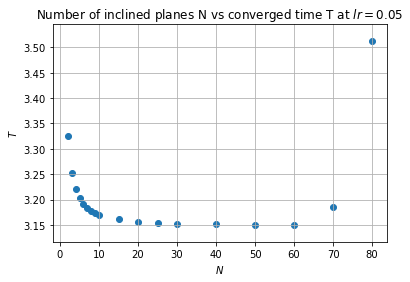

In [6]:
# Data gathered from testing robustness of the algorithm

xx = [2,3,4,5,6,7,8,9,10,15,20,25,30,40,50,60,70,80]
yy = [3.326,3.252,3.220 ,3.203,3.191,3.184,3.178,3.174,3.170,3.161,3.156,3.154,3.152,3.151,3.150, 3.150,3.185,3.512]
plt.scatter(xx,yy)
plt.title('Number of inclined planes N vs converged time T at $lr = 0.05$')
plt.xlabel('$N$')
plt.ylabel('$T$')
plt.grid()
plt.show()

In [7]:
# For loop approach --- Used for the animation

itn = 400

Y_record = np.zeros((N+1,itn))

for k in range(itn):
    Y += -lr*grad_T(Y)
    time  = T(Y)
    Y_record[:,k] = Y
    T_record.append(time)

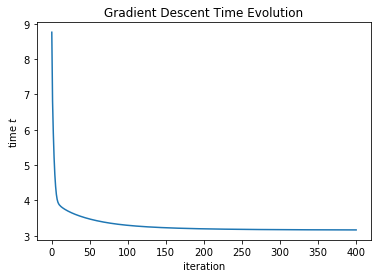

In [8]:
plt.plot(T_record)
plt.xlabel('iteration')
plt.ylabel('time $t$')
plt.title('Gradient Descent Time Evolution')
plt.show()

In [9]:
T_record[0], T_record[-1], T_record[-1]/np.pi

(8.759456960790901, 3.164977075811596, 1.0074434927758957)

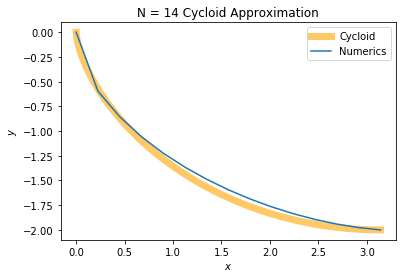

In [10]:
# Plots of converged approxiation and cycloid

make_brach(1)
plt.plot(x,Y,label = 'Numerics')
plt.title('N = ' + str(N) + ' Cycloid Approximation')
plt.xlabel('$x$')
plt.ylabel('$y$')
plt.legend(loc = 'upper right')
plt.show()

In [11]:
#--------------------------------------------------------
#Animation (takes a while to load...)
#--------------------------------------------------------


print('Radius  : ', 1)
print('gravity : ', g)
print('True Optimized Time: ' + "{:.3f}".format(time_brach(1,1)))


fig = plt.figure()
line, = plt.plot([], "r")
ax = plt.gca()

make_brach(1)


plt.xlim(0,np.pi)
plt.ylim(-2, 0)

plt.xlabel('x')
plt.ylabel('y')

plt.title('num of planes: $N$ = ' + str(N) + ' || learning rate $lr$ = '+ str(lr))
plt.close()


def animate(frame):
    y1 = Y_record[:,floor(frame)]
    line.set_data(x , y1)
    ax.text(0.77, 0.93, "iteration:" +  str(frame) + ' time: '+ str("{:.3f}".format(T_record[frame])), 
            bbox={'facecolor': 'red', 'pad': 5},
            transform=ax.transAxes, ha="center")

    
anim = FuncAnimation(fig,animate, frames = itn, interval = 30)

HTML(anim.to_jshtml())

Radius  :  1
gravity :  1
True Optimized Time: 3.142
